# YOLO_v5s Custom Dataset (2 Classes)


 - https://github.com/ultralytics/yolov5
 
 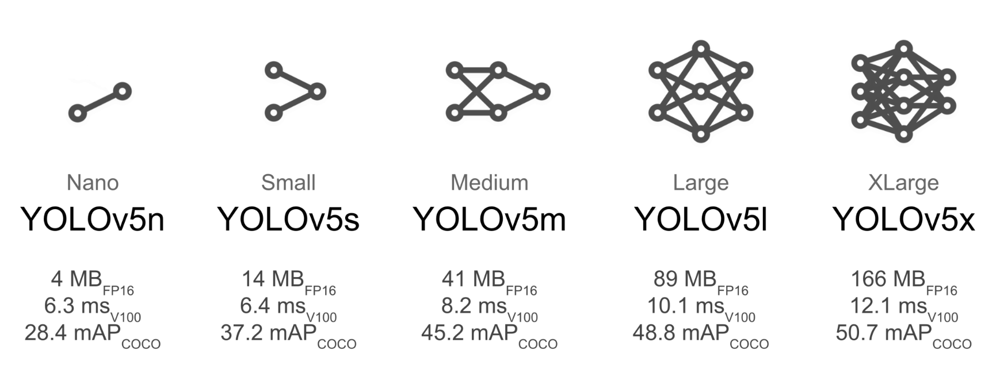

In [2]:
import warnings
warnings.filterwarnings('ignore')

# I. Custom Data_Set

  - 2 Classes

> ## 1) wget From Github

- 'maskdataset_2C.zip' 파일 다운로드

In [3]:
!wget https://raw.githubusercontent.com/rusita-ai/pyData/master/maskdataset_2C.zip

--2023-04-21 02:22:15--  https://raw.githubusercontent.com/rusita-ai/pyData/master/maskdataset_2C.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19667795 (19M) [application/zip]
Saving to: ‘maskdataset_2C.zip’

maskdataset_2C.zip  100%[===================>]  18.76M  --.-KB/s    in 0.1s    

2023-04-21 02:22:16 (137 MB/s) - ‘maskdataset_2C.zip’ saved [19667795/19667795]



- 현재 작업 경로

In [4]:
!pwd

/content


- 다운로드 결과 확인

In [5]:
!ls -l

total 19212
-rw-r--r-- 1 root root 19667795 Apr 21 02:22 maskdataset_2C.zip
drwxr-xr-x 1 root root     4096 Apr 19 13:37 sample_data


> ## 2) Unzip

In [6]:
!unzip -q /content/maskdataset_2C.zip -d /content

# II. Train vs. Test Split

> ## 1) Image Files

In [9]:
from glob import glob

img_list = glob('/content/dataset/images/*.jpg')

print(len(img_list))

100


> ## 2) Label Files

In [10]:
txt_list = glob('/content/dataset/images/*.txt')

print(len(txt_list))

100


> ## 3) 'labels' 디렉토리 생성

In [11]:
!mkdir /content/dataset/labels

- 생성 확인

In [12]:
!ls -ld /content/dataset/labels

drwxr-xr-x 2 root root 4096 Apr 21 02:24 /content/dataset/labels


> ## 4) Label Files 이동

- 'images' to 'labels' 디렉토리

In [13]:
for a in txt_list:
    !mv {a} /content/dataset/labels

- 실행 확인

In [14]:
img_list = glob('/content/dataset/images/*.jpg')
txt_list = glob('/content/dataset/labels/*.txt')
print(len(img_list))
print(len(txt_list))

100
100


> ## 5) train_test_split( )

In [17]:
from sklearn.model_selection import train_test_split

train_img_list, valid_img_list = train_test_split(img_list,
                                                 test_size = 0.2,
                                                 random_state = 2045)

print(len(train_img_list), len(valid_img_list))

80 20


- 목록 확인

In [18]:
print('Train_Img : ', train_img_list)
print('Valid_Img : ', valid_img_list)

Train_Img :  ['/content/dataset/images/maxresdefault3.jpg', '/content/dataset/images/kolkata1.jpg', '/content/dataset/images/msgsgsg.jpg', '/content/dataset/images/merlin_168867003_1a8a1c5a-76af-4542-8585-bd6745eb0922-master1050.jpg', '/content/dataset/images/img-1579662489-42239.jpg', '/content/dataset/images/mayors-walk-b.jpg', '/content/dataset/images/images103.jpg', '/content/dataset/images/maxresdefault1.jpg', '/content/dataset/images/images33.jpg', '/content/dataset/images/merlin_168528063_bf3cc2fc-0dc5-4941-82f2-190567367dd8-master1050.jpg', '/content/dataset/images/images248.jpg', '/content/dataset/images/KZJIS15WO6Beubo2G8EBQJpKpzIwOojzKyF02yshdNs.jpg', '/content/dataset/images/mfile_1505703_1_L_20200130190326.jpg', '/content/dataset/images/images285.jpg', '/content/dataset/images/merlin_167450115_211c72f4-b732-4b8f-aac3-de17afbab5cc-superJumbo.jpg', '/content/dataset/images/Medical-face-mask-printed-fashion-surgical-disposable_350x350.jpg', '/content/dataset/images/istockphot

> ## 6) Train.txt & Valid.txt 생성

In [19]:
with open('/content/dataset/Train.txt', 'w') as f:
    f.write('\n'.join(train_img_list) + '\n')

with open('/content/dataset/Valid.txt', 'w') as f:
    f.write('\n'.join(valid_img_list) + '\n')

- 생성 확인

In [20]:
!ls -l /content/dataset/*.txt

-rw-r--r-- 1 root root 4221 Apr 21 02:28 /content/dataset/Train.txt
-rw-r--r-- 1 root root 1049 Apr 21 02:28 /content/dataset/Valid.txt


> ## 7) data.yaml 생성

In [21]:
yaml_text = """train: /content/dataset/Train.txt
val: /content/dataset/Valid.txt

nc : 2
names : ['without_mask', 'with_mask']"""

with open('/content/dataset/data.yaml', 'w') as file:
    file.write(yaml_text)

- 생성 확인

In [22]:
%cat /content/dataset/data.yaml

train: /content/dataset/Train.txt
val: /content/dataset/Valid.txt

nc : 2
names : ['without_mask', 'with_mask']

# III. Yolov5 Configuration

> ## 1) Yolo_v5 Clone

In [23]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15553, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (113/113), done.
remote: Total 15553 (delta 65), reused 101 (delta 47), pack-reused 15393
Receiving objects: 100% (15553/15553), 14.59 MiB | 24.33 MiB/s, done.
Resolving deltas: 100% (10593/10593), done.


- 작업 경로 설정

In [25]:
%cd yolov5

/content/yolov5


> ## 2) Install Dependencies

In [26]:
%pip install -qr requirements.txt
%pip install -q roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 3.7 MB/s eta 0:00:00


> ## 3) Configuration Check

In [27]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.0.0+cu118 (Tesla T4)


# IV. Model Learning

- 현재 작업 경로

In [28]:
!pwd

/content/yolov5


> ## 1) YOLO_v5s

- yolov5s.pt
  - 약 6분

In [29]:
%%time

!python train.py --img 640 --batch 16 --epochs 150 --data /content/dataset/data.yaml --weights yolov5s.pt --cache --name mask_yolov5s_results

train: weights=yolov5s.pt, cfg=, data=/content/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=mask_yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0,

> ## 2) View TensorBoard

In [31]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

> ## 3) Object Detection 결과 확인

> ## (1) Loss & mAP

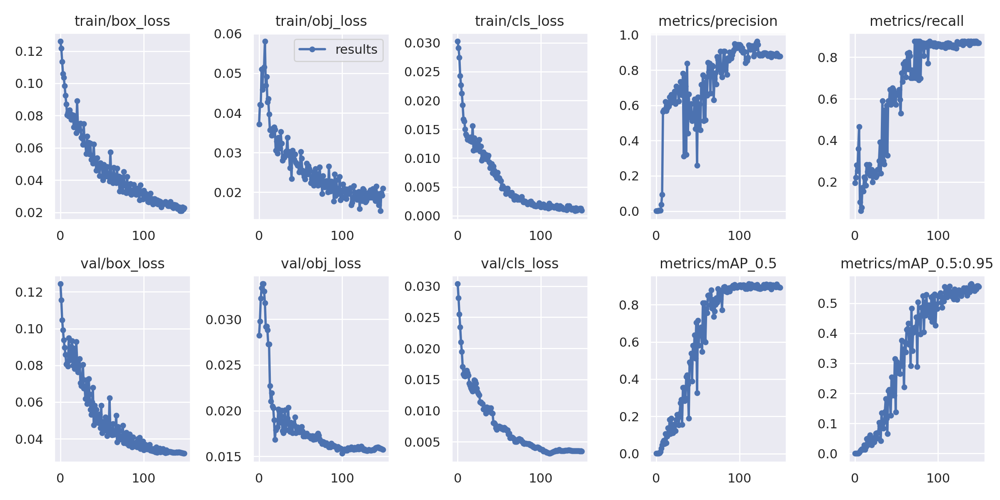

In [32]:
from IPython.display import Image

Image('/content/yolov5/runs/train/mask_yolov5s_results/results.png')

> ## (2) Training Results Visualization

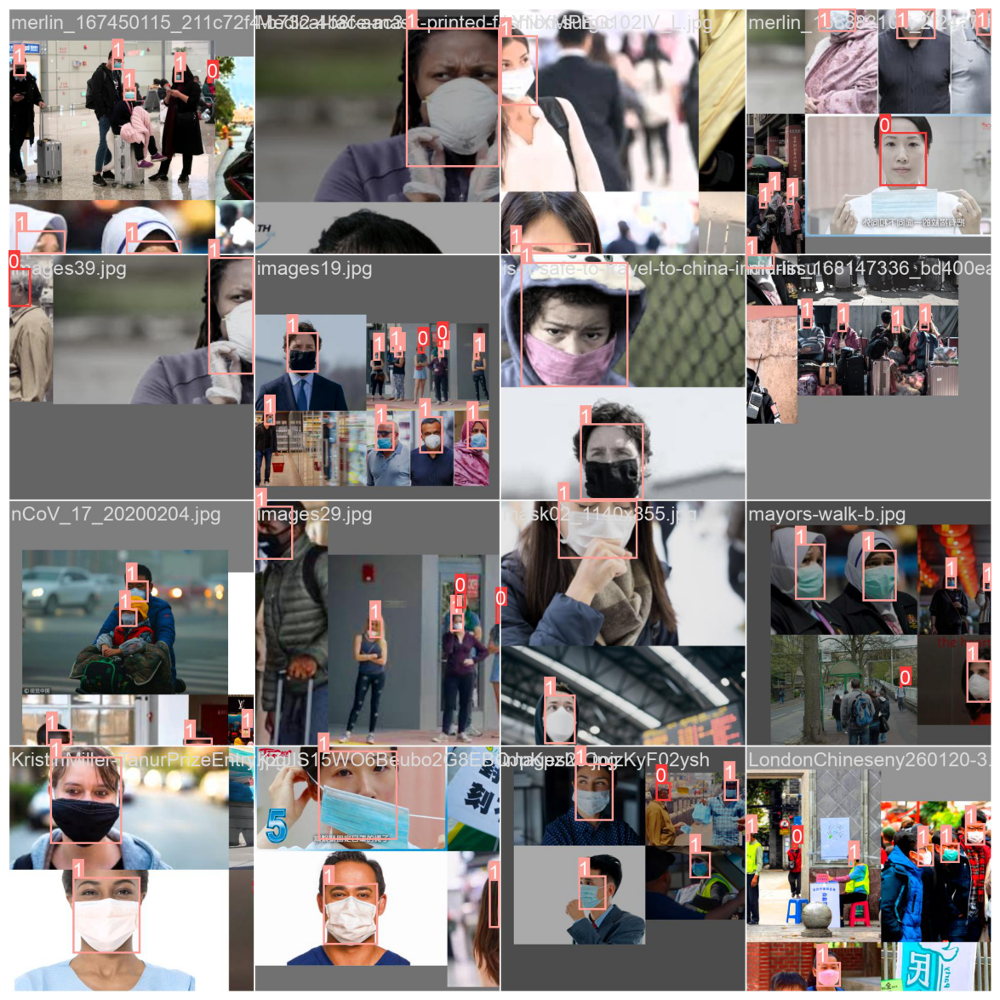

In [33]:
import matplotlib.pyplot as plt

img = plt.imread('/content/yolov5/runs/train/mask_yolov5s_results/train_batch0.jpg')

plt.figure(figsize = (20, 15))
plt.imshow(img)
plt.axis('off')
plt.show()

# V. Model Validation

- 현재 작업 경로

In [34]:
!pwd

/content/yolov5


> ## 1) Validation 데이터에 best.pt 적용

In [35]:
!python val.py --data /content/dataset/data.yaml --img 640 --weights /content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt

val: data=/content/dataset/data.yaml, weights=['/content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/dataset/Valid.cache... 20 images, 0 backgrounds, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:01<00:00,  1.53s/it]
                   all         20         66       0.89      0.877      0.907      0.564
          without_mask         20

# VI. Model Test

> ## 1) Test Directory

 - --source /content/dataset/test

In [36]:
!python detect.py --source /content/dataset/test --img 640 --weight /content/yolov5/runs/train/mask_yolov5s_results/weights/best.pt --conf 0.5 --n

usage: detect.py
       [-h]
       [--weights WEIGHTS [WEIGHTS ...]]
       [--source SOURCE]
       [--data DATA]
       [--imgsz IMGSZ [IMGSZ ...]]
       [--conf-thres CONF_THRES]
       [--iou-thres IOU_THRES]
       [--max-det MAX_DET]
       [--device DEVICE]
       [--view-img]
       [--save-txt]
       [--save-conf]
       [--save-crop]
       [--nosave]
       [--classes CLASSES [CLASSES ...]]
       [--agnostic-nms]
       [--augment]
       [--visualize]
       [--update]
       [--project PROJECT]
       [--name NAME]
       [--exist-ok]
       [--line-thickness LINE_THICKNESS]
       [--hide-labels]
       [--hide-conf]
       [--half]
       [--dnn]
       [--vid-stride VID_STRIDE]
detect.py: error: ambiguous option: --n could match --nosave, --name


> ## 2) Results Visualization

In [37]:
for imageName in glob.glob('/content/yolov5/runs/detect/Mask_Test_Image/*.jpg')
  display(Image(filename = imageName))
  print("\n")

SyntaxError: ignored